# Initialisation

In [ ]:
%matplotlib inline
import pandas as pd
# pd.set_option('display.max_rows', None)        # à décommenter si on veut afficher tout le dataframe
import numpy as np
import os
import sys
import datetime
import json
import requests
from pathlib import Path
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import logging                                 # désactivation des messages de kaleido
# Désactiver les logs de Kaleido
logging.getLogger('kaleido').setLevel(logging.WARNING)
logging.getLogger('choreographer').setLevel(logging.WARNING)

from matplotlib import colors as mcolors
colors = mcolors._colors_full_map
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import PowerNorm
from matplotlib.colors import LightSource

import geopandas as gpd
from scipy.interpolate import RegularGridInterpolator
from termcolor import colored                     # coloration du texte
import xarray as xr                               # gestion des xarray
import cartopy.crs as ccrs                        # cartographie
import cartopy.feature as cfeature
from cartopy.io.img_tiles import GoogleTiles
from tabulate import tabulate                     # impression du texte dans un format tabulé
import yaml
import plotly.express as px
from scipy import stats                           # calage d'une tendance linéaire pour les températures
from shapely.vectorized import contains
from scipy.ndimage import zoom
from scipy.ndimage import gaussian_filter
import rioxarray
from rasterio.enums import Resampling
from adjustText import adjust_text
from geopy.distance import geodesic
plt.rcParams['text.usetex'] = True                # paramètres latex
plt.rcParams['text.latex.preamble'] = '\\usepackage{libertine}'
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
plt.style.use('default')
date_calcul        = datetime.date.today()
année_en_cours     = date_calcul.year 
from module_valeurs_extremes import exporter_image, reload_valeurs_extremes

#################################
## Auteur : Christoophe Ancey  ##
## Date : Mai 2024             ##
## Mise à jour : 2 sep. 2025   ##
#################################

#-------------------------------------------
# Lecture du fichier de postes  
#-------------------------------------------
# adresse du répertoire de travail
répertoire_base      = '/Data/'
répertoire_principal = répertoire_base + 'meteo.data/base'
print("Je suis dans le répertoire : ", répertoire_base)
# teste si le répertoire existe
if not os.path.exists(répertoire_principal):
    # s'il n'existe pas le créer
    os.makedirs(répertoire_principal)
    print("J'ai créé le répertoire : ", répertoire_principal)
else:
    print("J'ai trouvé le répertoire : ", répertoire_principal)
 
os.chdir(répertoire_principal)
print("Je me place dans le répertoire : "+os.getcwd())

lignes_sortie = []

def ajouter_information(text):
    lignes_sortie.append(text)
from datetime import datetime
timestamp = datetime.now().strftime("%Y/%m/%d à %H:%M:%S")
ajouter_information('###################################')
ajouter_information("# Résumé de l'extraction safran   #")
ajouter_information('###################################')
ajouter_information(' ')
ajouter_information('date de création : '+timestamp)
ajouter_information("")

# outils de conversion des coordonnées
import pyproj

source_crs = 'epsg:2154' # Coordinate system of the file
target_crs = 'epsg:4326' # Global lat-lon coordinate system

# fonctions de conversion RGF93 <-> WGS
lambert_to_latlon = pyproj.Transformer.from_crs(source_crs, target_crs)
latlon_to_lambert = pyproj.Transformer.from_crs( target_crs,source_crs)

# lecture des altitudes pour les noeuds Safran
répertoire_doc = r'D:\Data\Safran\docs'
fichier_noeuds = Path(répertoire_doc) / "grilleSafran_complete_drias2021.csv"
noms = ['id_Point_Drias', 'X', 'Y', 'x_L2', 'y_L2', 'x_L93', 'y_L93', 'longitude', 'latitude', 'altitude']
liste_noeuds = pd.read_csv(fichier_noeuds,
                          skiprows=2,
                          names=noms,
                          sep=';',
                          skipinitialspace=True,
                          usecols=range(10))  # Ne lire que les 10 premières colonnes


Je suis dans le répertoire :  /Data/
J'ai trouvé le répertoire :  /Data/meteo.data/base
Je me place dans le répertoire : d:\Data\meteo.data\base


In [2]:
fichier_yaml = répertoire_base+'station_safran.yaml'
fichier_yaml = '/Data/station_safran.yaml'
with open(fichier_yaml, 'r',encoding='utf-8') as file:
        paramètres = yaml.safe_load(file)
 
flat_paramètres = {**{k: v for k, v in paramètres.items() if k != 'variables'}, **paramètres['variables']}
liste_paramètres = ['* '+k+':'+str(v) for k, v in flat_paramètres.items() ]
ajouter_information('--- information sur les données traitées ---')
for info in liste_paramètres:
        ajouter_information(info)
ajouter_information("")
paramètres


{'poste': 'Val Cenis (La Berche)',
 'commune': 'Val Cenis (La Berche)',
 'dossier': '/Data/meteo.data/postes/Val_Cenis_(La_Berche)_73144404',
 'id_station': '73144404',
 'longitude': 6.922333,
 'latitude': 45.274167,
 'altitude': 2101,
 'variables': {'pluie': True,
  'neige': True,
  'manteau': True,
  'TN': True,
  'TX': True,
  'TM': False}}

In [3]:
nom_poste    = paramètres['poste']
nom_commune  = paramètres['commune']      
existe_pluie = paramètres['variables']['pluie']       
existe_neige = paramètres['variables']['neige'] 
existe_HN    = paramètres['variables']['manteau'] 
existe_TN    = paramètres['variables']['TN'] 
existe_TX    = paramètres['variables']['TX'] 
existe_TM    = paramètres['variables']['TM'] 
répertoire_résultats = paramètres['dossier']
longitude_poste      = paramètres['longitude']
latitude_poste       = paramètres['latitude']  

import pickle
os.chdir(répertoire_résultats)
print("Je me place dans le répertoire : "+os.getcwd()) 
données_neige = pd.read_pickle(répertoire_résultats+'/données_neige.pkl')
if existe_pluie: données_pluie = pd.read_pickle(répertoire_résultats+'/données_pluie.pkl')

Je me place dans le répertoire : d:\Data\meteo.data\postes\Val_Cenis_(La_Berche)_73144404


# Connexion

In [4]:
# Récupération des informations
url_service='https://api.geosas.fr/edr/collections/safran-isba/'
r=requests.get(url_service,   verify=True) 
data_info=r.json()
if r.status_code == 200:
    print("La connexion est établie.")
else :
    print(colored("Il y a une erreur avec le code : {:d}.".format(r.status_code), 'red') )

La connexion est établie.


In [5]:
# Liste toutes les variables possibles
liste_variables_possibles = [['Nom',"Définition","unité"]]
for parametre in list(data_info['parameter_names']):
    name=data_info['parameter_names'][parametre]
    liste_variables_possibles.append([parametre, name['description'] ,name['unit']['label']])
print(colored("Liste des variables accessibles :",'cyan'))
print(tabulate(liste_variables_possibles))

Liste des variables accessibles :
--------  -----------------------------------------------------------  ---------------------
Nom       Définition                                                   unité
DLI_Q     Rayonnement atmosphérique (cumul quotidien)                  Joule par centimètre²
DRAINC_Q  Drainage (cumul quotidien 06-06 UTC)                         millimetre
ETP_Q     Evapotranspiration potentielle (formule de Penman-Monteith)  millimetre
FF_Q      Vent (moyenne quotidienne)                                   mètre par seconde
HU_Q      Humidité relative (moyenne quotidienne)                      Pourcentage
PRELIQ_Q  Précipitations liquides (cumul quotidien 06-06 UTC)          millimetre
PRENEI_Q  Précipitations solide (cumul quotidien 06-06 UTC)            millimetre
SSI_Q     Rayonnement visible (cumul quotidien)                        Joule par centimètre²
SWI_Q     Indice d'humidité des sols (moyenne quotidienne 06-06 UTC)   Pourcentage
TINF_H_Q  Température minim

# Données station

In [6]:
# nom du poste
# nom_poste = "Val Cenis" # nom
# coordonnées en RGF93 du poste
x_poste, y_poste = latlon_to_lambert.transform(latitude_poste,longitude_poste)

translation_x = 000 # rajout de 3 km


x_poste       = x_poste+translation_x
param_name = 'PRENEI_Q,PRELIQ_Q,T_Q'
#projection='EPSG:4326'
#coord='POINT('+str(latitude_poste)+" "+str(longitude_poste)+")"
#coord='POINT(1011370 6471230)'
coord      = 'POINT('+str(x_poste)+' '+str(y_poste)+')'
projection = 'EPSG:2154'
formatage  = 'CoverageJSON'
date       = '1959-01-01/2025-05-31'
requete    = f'https://api.geosas.fr/edr/collections/safran-isba/position?coords={coord}&crs={projection}&parameter-name={param_name}&f={formatage}&datetime={date}'
print(requete)
r=requests.get(requete, verify=True)
data=r.json()
if r.status_code == 200:
    print("J'ai récupéré les données.")
else :
    print(colored("Il y a une erreur avec le code : {:d}.".format(r.status_code), 'red') )

# coordonnées du noeud RGF93
x_safran = data['domain']['axes']['x']['values'] 
y_safran = data['domain']['axes']['y']['values'] 
# coordonnées du noeud WGS
lat_safran, lon_safran = lambert_to_latlon.transform(x_safran,y_safran)
# la grille SAFRAN est 8*8 km² donc il faut convertir pour avoir cela en lat, long : 
# 1° = 111 km en latitude et 111 km * cos(latitude) pour la longitude
delta_y = 4/111
delta_x = 4/111/np.cos(lat_safran[0]*3.14/180.)


#Coordonnées de la zone à représenter
lat_min, lat_max  = latitude_poste -0.7, latitude_poste +0.7
lon_min, lon_max  = longitude_poste-0.9, longitude_poste+0.5
central_longitude = (lon_min + lon_max) / 2
central_latitude  = (lat_min + lat_max) / 2

# Calcul de l'altitude du noeud Safran
distances_carrees = (liste_noeuds['x_L93'] - x_safran[0])**2 + (liste_noeuds['y_L93'] - y_safran[0])**2
index_plus_proche = distances_carrees.idxmin()
noeud_plus_proche = liste_noeuds.loc[index_plus_proche]
altitude_safran = noeud_plus_proche.altitude
print(f"Distance minimale : {np.sqrt(distances_carrees.min()):.2f} m")
print(f"Noeud le plus proche : {index_plus_proche}")
print(f"L'altitude moyenne sur le secteur est {altitude_safran} m")
paramètres_safran = {'noeud':int(noeud_plus_proche['id_Point_Drias']),'altitude':altitude_safran,
                     'latitude':lat_safran[0],'longitude':lon_safran[0],'ESPG':'2154',
                     'X':x_safran[0],'Y':y_safran[0],'delta_x':delta_x,'delta_y':delta_y}

 
liste_paramètres = ['* '+k+':'+str(v) for k, v in paramètres_safran.items() ]
ajouter_information('--- information sur le noeud safran ---')
for info in liste_paramètres:
        ajouter_information(info)
ajouter_information("")



https://api.geosas.fr/edr/collections/safran-isba/position?coords=POINT(1007438.4019957834 6471505.5820112)&crs=EPSG:2154&parameter-name=PRENEI_Q,PRELIQ_Q,T_Q&f=CoverageJSON&datetime=1959-01-01/2025-05-31
J'ai récupéré les données.
Distance minimale : 0.00 m
Noeud le plus proche : 7691
L'altitude moyenne sur le secteur est 2067.0 m


In [7]:
safran_temps         = data['domain']['axes']['t']['values']
safran_neige         = np.array(data['ranges']['PRENEI_Q']['values'])
safran_précipitation = np.array(data['ranges']['PRENEI_Q']['values'])+np.array(data['ranges']['PRELIQ_Q']['values'])
série_safran_neige   = pd.DataFrame()
série_safran_neige['neige'] = safran_neige
série_safran_neige['date']  = pd.to_datetime(safran_temps, format='%Y-%m-%dT%H-%M-%SZ')

série_safran_précipitation   = pd.DataFrame()
série_safran_précipitation['précipitation'] = safran_précipitation
série_safran_précipitation['date']          = pd.to_datetime(safran_temps, format='%Y-%m-%dT%H-%M-%SZ')
display(série_safran_neige)

,neige,date
0,0.0,1959-01-01
1,5.5,1959-01-02
2,9.4,1959-01-03
3,8.7,1959-01-04
4,3.5,1959-01-05
...,...,...
24253,0.0,2025-05-27
24254,1.6,2025-05-28
24255,0.0,2025-05-29
24256,0.0,2025-05-30


Le maximum a été atteint le 24/11/2016 avec un cumul journalier de 108.3 mm.


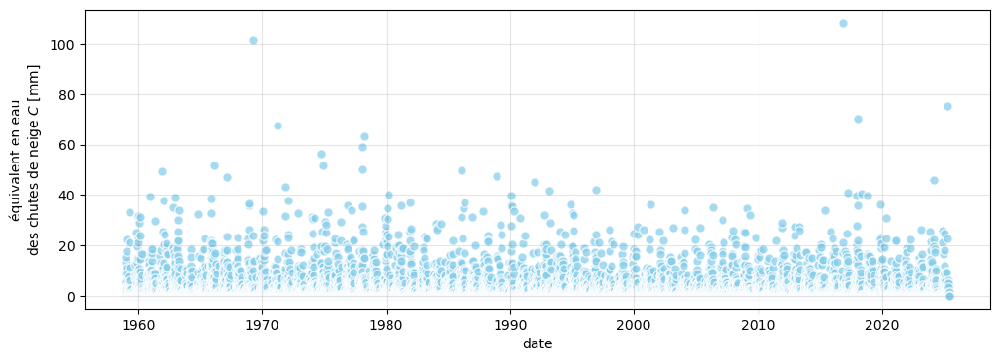

In [8]:
# distribution temporelle des distributions
fig, ax = plt.subplots(figsize=(12,4))
ax.scatter(série_safran_neige['date'], série_safran_neige['neige'], marker = "o",edgecolors='white', s=45, color='skyblue', alpha = 0.75)
ax.set_ylabel(r'équivalent en eau' '\n' r'des chutes de neige $C$ [mm]')
ax.set_xlabel(r'date')
max_neige = np.nanmax(safran_neige)
date_max= série_safran_neige[série_safran_neige['neige']==max_neige]['date'] .values[0]   
# le format de données du temps est bizarre il faut supprimer les 10 dernier caractères
date_max=datetime.strptime(str(date_max)[:-10] ,"%Y-%m-%dT%H:%M:%S").strftime("%d/%m/%Y")
print("Le maximum a été atteint le "+date_max+" avec un cumul journalier de {:.1f} mm.".format(max_neige))   
plt.grid(True, color = 'gray', alpha=0.2)

#fig.savefig("Cumul_précipitations(RR)_Safran.pdf",bbox_inches='tight')
#fig.savefig(répertoire_résultats+'/'+"Cumul_précipitations(RR_neige)_Safran.png",bbox_inches='tight',dpi=300)

In [9]:
unité_comparaison = 'W' # W: week, ME: month, YE: year
sel2=données_neige.resample(unité_comparaison, on='date')['neige'].sum()
#dernière_année_nulle = 2024
#if dernière_année_nulle.year != 2021:
      #début_sélection_mesure = dernière_année_nulle
      #fin_sélection_mesure = données_pluie['date'].values[-1]
      #selection_mesure =sel2[sel2.index>début_sélection_mesure]
#else:
début_sélection_mesure = données_neige['date'].values[0]
fin_sélection_mesure = "2024-12-31"
selection_mesure =sel2[sel2.index<=fin_sélection_mesure]

cumul_safran=série_safran_neige.resample(unité_comparaison, on= 'date').sum()
filtrage_date = (cumul_safran.index> début_sélection_mesure) & (cumul_safran.index <= fin_sélection_mesure)
selection_safran = np.array(cumul_safran[filtrage_date])

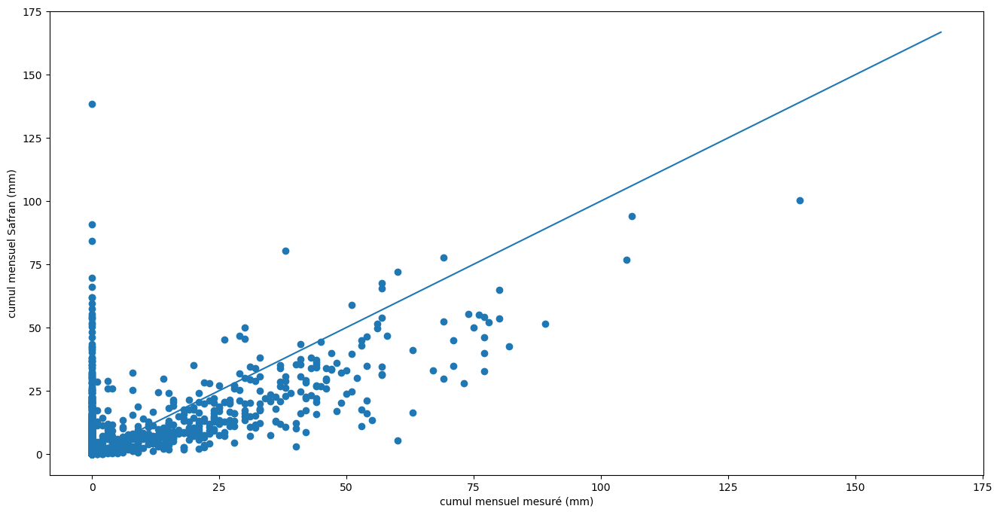

In [10]:
if selection_mesure.size == selection_safran.size:
      fig, ax = plt.subplots(figsize=(16,8))
      x = np.linspace(0,max(sel2)*1.2,10)
      ax.plot(x,x)
      ax.scatter(x=selection_mesure,y=selection_safran)
      ax.set_xlabel("cumul mensuel mesuré (mm)")
      ax.set_ylabel("cumul mensuel Safran (mm)")
      fig.savefig(répertoire_résultats+'/'+'comparaison_mesures2032_safran.pdf')
else:
      print(colored("Il faut ajuster la période des données car les deux échantillons n'ont pas la même longueur.",'red'))

In [11]:
# -----------trace une carte plotly avec le point de maille en spécifiant le nom de la trace pour la légende   

fig = px.scatter_map(lat= lat_safran, lon= lon_safran, map_style= "open-street-map", 
                        color_discrete_sequence= [ 'red'],
                        height= 800, width= 1200,#title= 'Noeud SAFRAN du poste de mesure', 
                        zoom = 11, 
                        # labels= 'Maille la plus proche'
                       hover_name= ['Maille la plus proche'],    
                      )

fig.add_trace(go.Scattermap(lat= lat_safran, lon= lon_safran, mode= 'markers', marker= {'size': 10, 'color': 'red'}, name= 'Noeud Safran', ))
fig.add_trace(go.Scattermap(lat= [latitude_poste], lon= [longitude_poste], mode= 'markers', marker= {'size': 10, 'color': 'blue'}, name= 'Poste de mesure', ))
#fig.add_trace(go.Scattermapbox(lat= [lat_safran-0.036,lat_safran+0.036], lon= [lon_safran-0.036,lon_safran+0.036], 
#                               mode= 'markers', marker= {'size': 8, 'color': 'black'}, name= 'limites maille Safran', ))


fig.add_trace(go.Scattermap(
    mode = "markers+lines", name= 'limites',
    lon = [lon_safran[0]-delta_x, lon_safran[0]-delta_x, lon_safran[0]+delta_x, lon_safran[0]+delta_x,lon_safran[0]-delta_x], 
    lat = [lat_safran[0]-0.036, lat_safran[0]+0.036, lat_safran[0]+0.036, lat_safran[0]-0.036,lat_safran[0]-0.036],
    marker = {'size': 5}))


# Réduire les marges et repositionner la légende
fig.update_layout(
    margin={"r":0, "t":0, "l":0, "b":0},  # Réduit les marges (right, top, left, bottom)
    legend=dict(
        x=1,  # Position horizontale (1 = droite)
        y=1,  # Position verticale (1 = haut)
        xanchor='right',  # Ancre la légende par sa droite
        yanchor='top',  # Ancre la légende par son haut
        bgcolor='rgba(255, 255, 255, 0.8)',  # Fond blanc semi-transparent
        bordercolor='black',
        borderwidth=1
    )
)

fig.write_image('carte_localisation_mesures_safran.png', scale=3)
fig

In [12]:
fig = go.Figure()

# (1) Ajouter le point rouge - il faut enlever les crochets autour de lat_safran et lon_safran
fig.add_trace(go.Scattermap(
    lat=lat_safran,  # Sans crochets si c'est déjà une liste
    lon=lon_safran,
    mode='markers',
    name='Noeud Safran',
    marker=dict(size=15, color='red'),
    text=['Station Météo']
))

fig.add_trace(go.Scattermap(
    lat=[latitude_poste], 
    lon=[longitude_poste], 
    mode='markers', 
    marker={'size': 15, 'color': 'blue'}, 
    name='Poste de mesure'
))

# (2) Rectangle avec bordure noire et remplissage semi-transparent
fig.add_trace(go.Scattermap(
    mode="lines",
    name='Limites',
    lon=[lon_safran[0]-delta_x, lon_safran[0]-delta_x, lon_safran[0]+delta_x, 
         lon_safran[0]+delta_x, lon_safran[0]-delta_x],
    lat=[lat_safran[0]-0.036, lat_safran[0]+0.036, lat_safran[0]+0.036, 
         lat_safran[0]-0.036, lat_safran[0]-0.036],
    line=dict(color='black', width=2),
    fill='toself',  # Remplit l'intérieur du polygone
    fillcolor='rgba(255, 255, 255, 0.35)'  # Gris avec 20% d'opacité
))

fig.update_layout(
    map=dict(
        style='white-bg',
        layers=[
            {
                "below": 'traces',
                "sourcetype": "raster",
                "sourceattribution": "OpenTopoMap",
                "source": [
                    "https://a.tile.opentopomap.org/{z}/{x}/{y}.png"
                ]
            }
        ],
        center=dict(lat=lat_safran[0], lon=lon_safran[0]),
        zoom=12
    ),
    height=800,
    width=1200,
    margin={"r":0, "t":0, "l":0, "b":0},
    legend=dict(
        x=1,
        y=1,
        xanchor='right',
        yanchor='top',
        bgcolor='rgba(255, 255, 255, 0.8)',
        bordercolor='black',
        borderwidth=1
    )
)

fig.show()

# (3) Sauvegarder avec la même taille qu'à l'écran
fig.write_image('carte_localisation_mesures_safran.png', 
                width=1200, height=800, scale=1)

# Cartes et masques

## Masques et grilles d'interpolation

In [13]:
#fichier = "/home/ancey/Cartographie/carte_France/georef-france-region-millesime.shp"
fichier = '/Data/Cartographie/carte_France/georef-france-region-millesime.shp'

regions = gpd.read_file(fichier)
# Sélection des régions de métropole
regions = regions[regions.reg_area_co == 'FXX']   # Classement par ordre alphabétique
regions = regions.sort_values(by = 'reg_name_up') # Réinitialisation de l'index
regions = regions.reset_index(drop = True)

# On choisit la région Rhône-Alpes
position =  int(np.array(np.where(np.array(regions['reg_name_up'])=='RHONE-ALPES') ) [0,0])
region_choisie = regions.iloc[position]
# cas 2 : pays -> France
# Source du fichier : https://www.naturalearthdata.com/downloads/10m-cultural-vectors/
#fichier = "/home/ancey/Cartographie/carte_France/europe/europe.shp"
fichier = '/Data/Cartographie/carte_France/europe/europe.shp'
pays    = gpd.read_file(fichier)
position    =  int(np.array(np.where((np.array(pays['NAME'])=='France') & (np.array(pays['CONTINENT'])=='Europe')) ) [0,0])
pays_choisi = pays.iloc[position]

In [14]:
# Interpolation du xarray
new_lon = np.linspace(lon_min, lon_max, 2000)   
new_lat = np.linspace(lat_min, lat_max, 2000)

# grille de type mesh
lon_grid, lat_grid = np.meshgrid(new_lon, new_lat)

# masque pour la france
coarse_mask = contains(pays_choisi.geometry, lon_grid.ravel(), lat_grid.ravel())
coarse_mask = coarse_mask.reshape(lon_grid.shape)

pas = 1                                                      # pas = 1 => pas de zoom
france_mask = zoom(coarse_mask.astype(float), pas, order=1)  # order=1 => bilinéaire si on zoome
france_mask = france_mask > 0.5                              # seuil fixé à 50 % pour la détection

# à modifier si le seuil déforme le pourtour des frontières
#france_mask = france_mask[:len(new_lat), :len(new_lon)]

## Villes

In [15]:
seuil_rayon_km   = 10   # rayon minimal entre deux villes affichées
seuil_population = 5000 # population minimale
# Lecture du fichier Excel
#liste_villes = pd.read_excel('/home/ancey/Cartographie/carte_France/Communes-de-France-2023.xlsx')
fichier = 'D:/Data/Cartographie/carte_France/Communes-de-France-2023.xlsx'
liste_villes = pd.read_excel(fichier)
# Filtrage initial
villes_région = liste_villes[
    (liste_villes['Population'] > seuil_population) &
    #(liste_villes['Région'] == 'Auvergne-Rhône-Alpes') | (liste_villes['Région'] == "Provence-Alpes-Côte d'Azur") &
    (liste_villes['Longitude'] > lon_min) &
    (liste_villes['Longitude'] < lon_max) &
    (liste_villes['Latitude'] > lat_min) &
    (liste_villes['Latitude'] < lat_max) 
][['Nom (minuscules)', 'Département', 'Latitude', 'Longitude', 'Population']]
villes_région = villes_région.dropna(subset=['Latitude', 'Longitude'])
# Tri décroissant par population
villes_triées = villes_région.sort_values('Population', ascending=False)

# Liste des villes retenues (éviter les doublons géographiques)
villes_retenues = []
coord_retenues  = []


for _, ville in villes_triées.iterrows():
    lat_v, lon_v = ville['Latitude'], ville['Longitude']
    trop_proche = False

    for lat_sel, lon_sel in coord_retenues:
        distance = geodesic((lat_v, lon_v), (lat_sel, lon_sel)).km
        if distance < seuil_rayon_km:
            trop_proche = True
            break

    if not trop_proche:
        villes_retenues.append(ville)
        coord_retenues.append((lat_v, lon_v))

# Résultat final sous forme de DataFrame
choix_villes = pd.DataFrame(villes_retenues)
print(tabulate(choix_villes))

-----  -----------------------  ------------  -------  -------  ------
31209  Annecy                   Haute-Savoie  45.9037  6.1297   134942
30884  Albertville              Savoie        45.6693  6.39087   20414
31437  Sallanches               Haute-Savoie  45.9434  6.62764   17450
 1812  Briançon                 Hautes-Alpes  44.898   6.64353   11095
31251  Chamonix-Mont-Blanc      Haute-Savoie  45.9233  6.86641    9019
31118  Saint-Jean-de-Maurienne  Savoie        45.2726  6.34989    7894
31315  Faverges-Seythenex       Haute-Savoie  45.7532  6.30646    7814
30924  Bourg-Saint-Maurice      Savoie        45.6193  6.76884    7561
31459  Thônes                   Haute-Savoie  45.8813  6.32219    6876
-----  -----------------------  ------------  -------  -------  ------


## Hydrologie

In [16]:
# fichier_rivière = '/home/ancey/Cartographie/hydrosheds/rivières_alpes.gpkg'
# fichier_lac = '/home/ancey/Cartographie/hydrosheds/lacs_alpes.gpkg'
fichier_rivière = '/Data/Cartographie/hydrosheds/rivières_alpes.gpkg'
fichier_lac = '/Data/Cartographie/hydrosheds/lacs_alpes.gpkg'
lacs = gpd.read_file(fichier_lac)
rivières = gpd.read_file(fichier_rivière)

## Code couleurs

In [17]:
couleurs_précipitation = [
    (0.00, "#00008B"),  # Deep Blue
    (0.15, "#0000CD"),
    (0.30, "#0000FF"),
    (0.50, "#ADD8E6"),
    (0.75, "#FFFFE0"),
    (1.00, "#FFD700")
]

custom_cmap = LinearSegmentedColormap.from_list("EnhancedBlue", couleurs_précipitation)
custom_cmap_r = custom_cmap.reversed()

## MNT Alpes

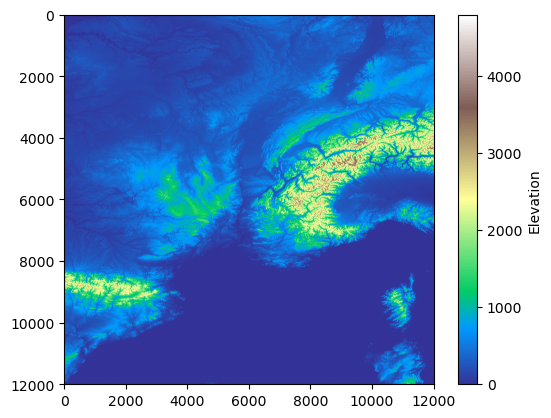

In [18]:
# données MNT Alpes tiré de https://ec.europa.eu/eurostat/web/gisco/geodata/digital-elevation-model/copernicus#Elevation

#mnt_adresse = "/home/ancey/Cartographie/DEM/10_DEM_y40x0.tif"
mnt_adresse = "/Data/Cartographie/DEM/10_DEM_y40x0.tif"
elevation_da = rioxarray.open_rasterio(mnt_adresse, masked=True)
elevation_2d = elevation_da.squeeze()

# Now plot
plt.imshow(elevation_2d, cmap='terrain', origin='upper')
plt.colorbar(label='Elevation')
plt.show()

In [19]:
# Découpage pour les besoins
 
cadre_limite      = (lon_min, lat_min, lon_max, lat_max)
carte_extension   = [lon_min, lon_max, lat_max, lat_min]  
elevation_clipped = elevation_da.rio.clip_box(*cadre_limite).squeeze()
 

# Extraction des données
elevation = elevation_clipped.values
lon = elevation_clipped['x'].values
lat = elevation_clipped['y'].values
# Vérification
if lat[0] < lat[-1]:
    lat = lat[::-1]
    elevation = elevation[::-1, :]

# création d'un relief par ombrage
ls        = LightSource(azdeg=315, altdeg=45)
hillshade = ls.shade(elevation, cmap=plt.cm.Greys, blend_mode='overlay')


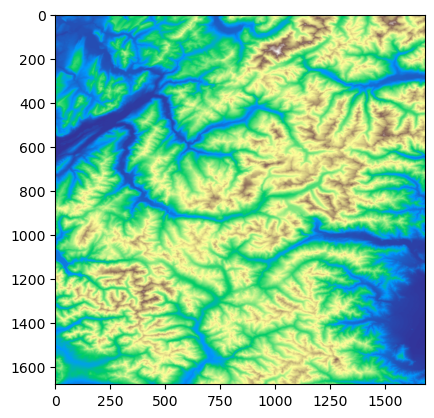

In [20]:
plt.imshow(elevation_clipped, cmap='terrain', origin='upper')

## Fonctions de traçage

In [51]:

 

def fond_topographique(longitude_poste, latitude_poste, nom_poste:str, 
                       taille = (18,15),projection='normal'):
    """ 
    fournit le fond topographique
    données :
    * longitude_poste, 
    * latitude_poste, 
    * nom_poste: string
      fournit la taille de l'image par rapport aux coordonnées du poste
    * taille: par défaut (18,15)
    * projection='normal' si on choisit "lambert", la carte aura une projection de type
      Lambert conforme (le temps de traçage est deux fois plus grand)
    """


    fig = plt.figure(figsize=taille, facecolor = 'w')
    if projection == 'lambert':
        ax = plt.axes(projection = ccrs.LambertConformal(central_longitude = central_longitude,
                                                    central_latitude = central_latitude))
    else:
        ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([lon_min, lon_max, lat_min, lat_max])
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=1, color='gray', alpha=0.75, linestyle='-')
    gl.xlabel_style = {'size': 12, 'color': 'gray','rotation':0}
    gl.ylabel_style = {'size': 12, 'color': 'gray','rotation': 90}
    gl.top_labels = False
    gl.right_labels = False

    # villes
    plt.scatter( x= longitude_poste, y = latitude_poste, color = 'black', transform=ccrs.PlateCarree(), zorder = 200)
    plt.text( longitude_poste,latitude_poste+0.01, nom_poste, horizontalalignment='center',
            fontsize = 14, weight = 'bold', transform=ccrs.PlateCarree(), zorder = 200)
    # for villes in choix_villes: 
    #         plt.scatter(x = villes[3], y= villes[2], marker = '+', color = 'black',transform=ccrs.PlateCarree(), zorder = 200)
    #         plt.text(villes[3], villes[2]+.02, villes[0],fontsize = 12, horizontalalignment='center' , transform=ccrs.PlateCarree(), zorder = 200)
 

    # On stocke les objets texte dans une liste
    textes = []
    
    for _, ville in choix_villes.iterrows():
        lon = ville['Longitude']
        lat = ville['Latitude']
        nom = ville['Nom (minuscules)']

        # Le point (facultatif si déjà dessiné ailleurs)
        plt.scatter(lon, lat, marker='+', color='black', transform=ccrs.PlateCarree(), zorder=200)
        fontsize = 10 + 5 * (ville['Population'] / villes_région['Population'].max())
        # Création du texte, légèrement décalé au départ
        text = plt.text(lon, lat + 0.02, nom, fontsize=fontsize, ha='center',
                        transform=ccrs.PlateCarree(), zorder=200)
        textes.append(text)
    
    # Ajustement automatique des textes pour éviter les collisions
    adjust_text(textes, 
                expand_text=(1.1, 1.5),  # expansion de l’espace autour du texte
                arrowprops=dict(arrowstyle='-', color='gray') )  # flèches vers les points

    
    #relief
    ax.imshow(
        hillshade[::-1],
        extent=carte_extension,
        transform=ccrs.PlateCarree(),
        origin='upper',
        zorder=0,
        alpha=0.9
    )
    # hydrologie
    rivières.plot(
        ax=ax,  # Plot on the same axis
        color=mcolors.CSS4_COLORS['powderblue'],
        linewidth=1,
        alpha=0.7,
        zorder=50,   
        transform=ccrs.PlateCarree()   
    )
    lacs.plot(
        ax=ax,  # Plot on the same axis
        color=mcolors.CSS4_COLORS['powderblue'] ,
        linewidth=0.8,
        alpha=0.9,
        zorder=50,   
        transform=ccrs.PlateCarree()   
    )
        #Affichage des côtes, frontières et océans
    ax.coastlines(zorder = 101)
    ax.add_feature(cfeature.BORDERS, zorder = 101, edgecolor = 'orange', ls = '--',linewidth=3)
    #ax.add_feature(cfeature.OCEAN, zorder = 99, edgecolor = 'lightgray')
    ax.add_feature(cfeature.STATES,linewidth=0.5 , edgecolor = 'orange' )
    return fig, ax


def tracer(neige,cmap=custom_cmap_r,projection='normal',titre='précipitations (mm)',taille=(15,12),pas=200,
           calcul_valeur_min = False,
           gamma=0.6,température = False,sigma=1,facteur_interpolation = 2,nom_poste = nom_commune):
    """ 
    trace le xarray eneige sur le fond topgraphique appelé par la fonction fond_topographique
    arguments :
    * cmap       = color map. Par défaut, la plage de couleurs définie par custom_cmap_r,
    * projection = projection du système de coordonnées. Par défaut projection classique
    * titre      = nom de la barre de couleurs
    * taille     = taille du graphique. Par défaut taille=(15,12)
    * pas        = incrément pour les contours. Par défaut, pas = 200 mm
    * calcul_valeur_min [Boolean] : si oui, on calcule la valeur minimale du xarray neige, si non, on prend valmin = 0
    * gamma      = distorsion de l'échelle de couleur. Par défaut gamma = 0.6
    * température= si la carte implique des températures (ou des variations relatives), les valeurs maximales
                   et minimales doivent être calculées différemment
    * sigma      = lissage du champ de valeur
    * facteur_interpolation = facteur de raffinement (par défaut 2)
    """

    neige_na = neige.fillna(0)

    # variables globales : new_lon, new_lat, france_mask
    neige_interpolation = neige_na.interp(x=new_lon, y=new_lat, method='cubic')  
    # Application du masque
    neige_masque = neige_interpolation.where(france_mask)  
    #  1 — lissage
    neige_lisse= gaussian_filter(neige_masque.values, sigma=sigma)
    #  2 — interpolation sur grille fine
    interp_func = RegularGridInterpolator((neige_masque.y.values, neige_masque.x.values), neige_lisse)
    x_min = neige_masque.x.min().item()
    x_max = neige_masque.x.max().item()
    y_min = neige_masque.y.min().item()
    y_max = neige_masque.y.max().item()

    x_new = np.linspace(x_min, x_max, neige.x.size * 2)
    y_new = np.linspace(y_min, y_max, neige.y.size * 2)
    X_new, Y_new = np.meshgrid(x_new, y_new)
    points = np.array([Y_new.ravel(), X_new.ravel()]).T
    Z_new = interp_func(points).reshape(Y_new.shape)
    valmax = np.ceil(np.max(neige_masque ).values/100)*100
    if calcul_valeur_min:
         valmin = np.floor(np.min(neige_masque ).values/100)*100
    else:
         valmin = 0
    if température:
         valmax = np.ceil(np.max(neige_masque ).values)
         valmin = np.floor(np.min(neige_masque ).values)

    # appel du fon topo
    fig, ax = fond_topographique(longitude_poste,latitude_poste,nom_poste,taille=taille,
                                 projection=projection)
    im = neige_masque.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        vmin=valmin, vmax=valmax,
        cmap=cmap  ,
        norm=PowerNorm(gamma=gamma),
        alpha=0.75,
        robust=False,
        add_colorbar=False
    )
    #contours lines
    contour_levels = np.arange(valmin,valmax,pas)  
    contours = ax.contour(
        x_new, y_new, Z_new,
        levels=contour_levels,
        colors='purple',
        alpha = 0.8,
        linewidths=0.8,
        transform=ccrs.PlateCarree()
    )
    ax.clabel(contours, inline=True, fontsize=10, fmt='%1.0f')
    cb = plt.colorbar(im, orientation="vertical", pad=0.05)
    cb.set_label(label=titre, fontsize=14)#,weight='bold')
    cb.ax.tick_params(labelsize='large')


    return fig, ax
 


(<Figure size 1800x1500 with 1 Axes>, <GeoAxes: >)

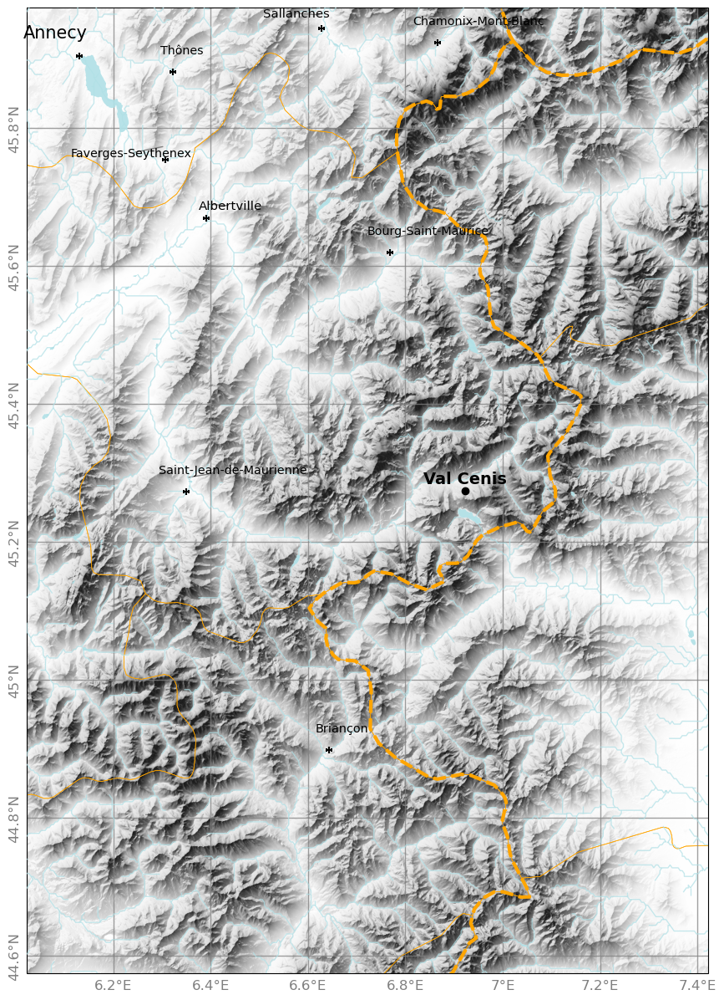

In [23]:
fond_topographique(longitude_poste, latitude_poste,nom_poste='Val Cenis') #nom_commune)

# Cartes 2025

In [24]:
param_name = 'PRENEI_Q,PRELIQ_Q,T_Q'
box        = str(longitude_poste-1)+","+str(latitude_poste-1)+","+str(longitude_poste+1)+","+str(latitude_poste+1)
 
projection = 'EPSG:4326'
formatage  = 'NetCDF4'
date       = '2025-01-01/2025-12-31'  # à modifier selon besoin
requete=f'https://api.geosas.fr/edr/collections/safran-isba/cube?bbox={box}&crs={projection}&parameter-name={param_name}&f={formatage}&datetime={date}'
print(requete)
r=requests.get(requete)
if r.status_code == 200:
    print("requete ok")
else :
    print("erreur code :", r.status_code)

https://api.geosas.fr/edr/collections/safran-isba/cube?bbox=5.922333,44.274167,7.922333,46.274167&crs=EPSG:4326&parameter-name=PRENEI_Q,PRELIQ_Q,T_Q&f=NetCDF4&datetime=2025-01-01/2025-12-31
requete ok


In [25]:
data   = xr.open_dataset(r.content)
# calcul du cumul de neige
neige  = data.PRENEI_Q.sum(dim="time") #ds2
data

<xarray.Dataset> Size: 3MB
Dimensions:      (time: 365, y: 27, x: 25)
Coordinates:
  * time         (time) datetime64[ns] 3kB 2025-01-01 2025-01-02 ... 2025-12-31
  * y            (y) float64 216B 46.31 46.23 46.15 46.07 ... 44.4 44.32 44.24
  * x            (x) float64 200B 5.982 6.061 6.141 6.221 ... 7.737 7.817 7.896
Data variables:
    PRENEI_Q     (time, y, x) float32 986kB nan nan 0.0 0.0 ... nan nan nan nan
    PRELIQ_Q     (time, y, x) float32 986kB ...
    T_Q          (time, y, x) float32 986kB ...
    spatial_ref  int32 4B ...
Attributes:
    description:  Données quotidiennes du modèle de simulation des schémas de...
    id:           safran-isba
    title:        Safran-Isba, Données changement climatique - SIM quotidienne
    crs:          EPSG:4326
    rel:          https://www.etalab.gouv.fr/licence-ouverte-open-licence/

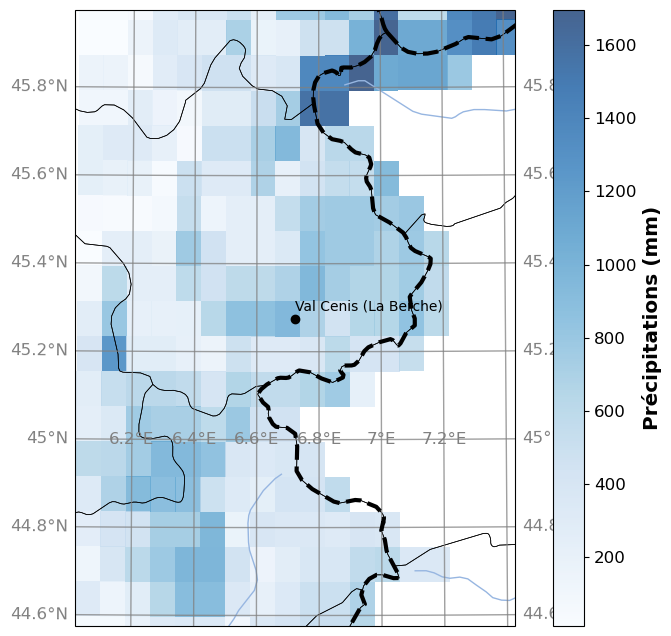

In [26]:
neige_positive    = neige.where(neige>0)               # on ne garde que les valeurs numériques


cmap = 'Blues'
#Initialisation de la figure    
fig = plt.figure(figsize=(10,8), facecolor = 'w')
ax  = plt.axes(projection = ccrs.LambertConformal(central_longitude = central_longitude,
                                                 central_latitude = central_latitude))
ax.set_extent([lon_min, lon_max, lat_min, lat_max])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=1, color='gray', alpha=0.75, linestyle='-')
gl.xlabel_style = {'size': 12, 'color': 'gray'}
gl.ylabel_style = {'size': 12, 'color': 'gray'}
#Affichage des côtes, frontières et océans
ax.coastlines(zorder = 101)
ax.add_feature(cfeature.BORDERS, zorder = 101, edgecolor = 'black', ls = '--',linewidth=3)
ax.add_feature(cfeature.OCEAN, zorder = 99, edgecolor = 'lightgray')
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.STATES,linewidth=0.5 )


im = neige_positive.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),  
    # usual xarray stuff
    cbar_kwargs = None,
    #cbar_kwargs={"orientation": "vertical", "shrink": 0.75 },
    add_colorbar=False,
    robust=True, 
    alpha = 0.75, 
    cmap  = cmap
)
ax.scatter( longitude_poste,latitude_poste,color = 'black')
ax.text( longitude_poste,latitude_poste+2000,nom_poste)

cb = plt.colorbar(im, orientation="vertical", pad=0.05)
cb.set_label(label='Précipitations (mm)', fontsize='x-large',weight='bold')
cb.ax.tick_params(labelsize='large')
# relief
#ax.add_image(relief, 12)
plt.show()

In [27]:
# Export
fig.savefig(répertoire_résultats+'/'+"extrait-Safran-2024.png",bbox_inches='tight')

In [28]:
répertoire_résultats

'/Data/meteo.data/postes/Val_Cenis_(La_Berche)_73144404'

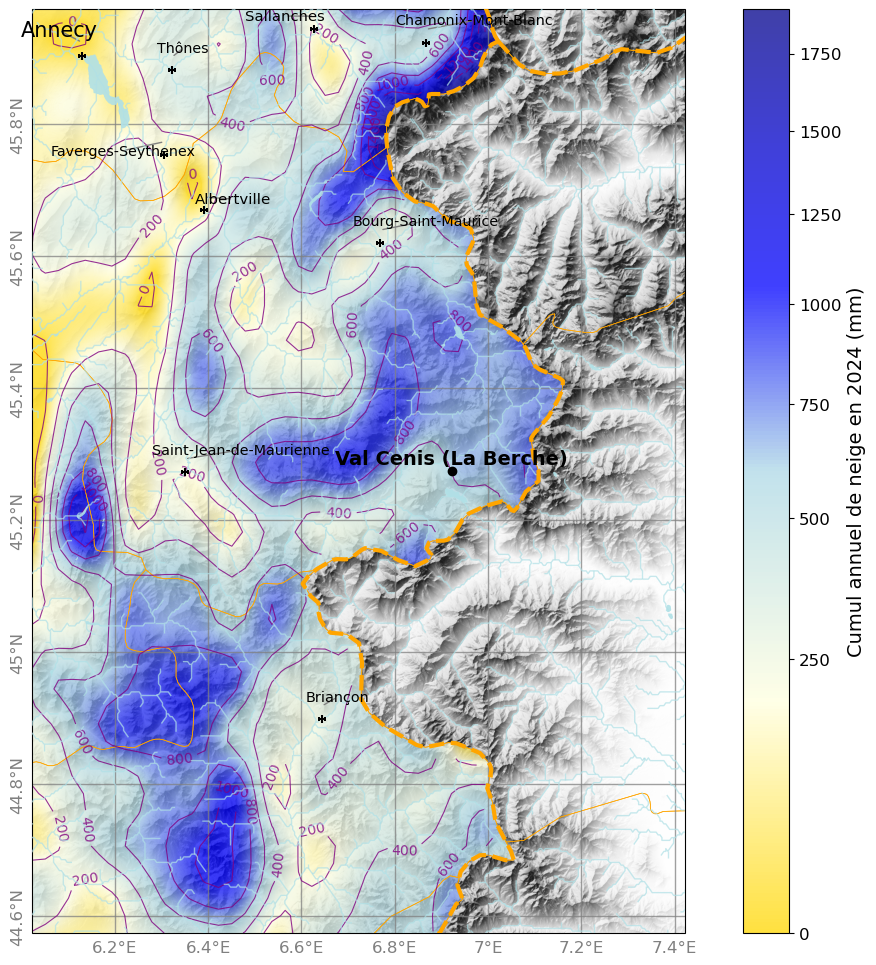

In [29]:
fig, _ = tracer(neige,titre='Cumul annuel de neige en 2024 (mm)')

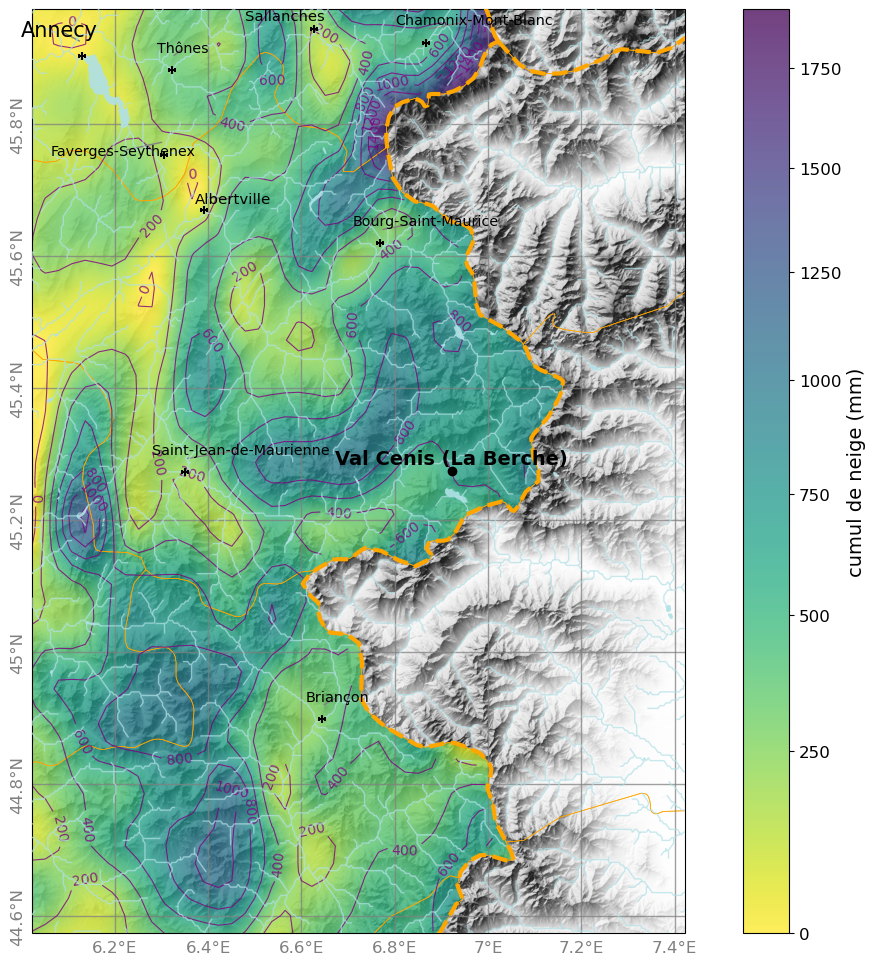

In [30]:
fig, _ = tracer(neige,projection='normal',cmap='viridis_r',titre='cumul de neige (mm)',pas=200,gamma=0.8)

In [31]:
fig.savefig(répertoire_résultats+'/'+f'cumul_annuel_{année_en_cours-1}_viridis.png',dpi=300,bbox_inches='tight')

In [32]:
print(f"Cumul sur {nom_poste} : {neige.sel(x=longitude_poste,y=latitude_poste,method="nearest").values:0.1f} mm.")

Cumul sur Val Cenis (La Berche) : 648.4 mm.


In [33]:
fig.savefig(répertoire_résultats+'/'+f'cumul_annuel_{année_en_cours-1}.png',dpi=300,bbox_inches='tight')

In [34]:
variabilité_cumul = []
for i in range(-1,2):
      for j in range(-1,2):
            x=neige_positive.sel(x=longitude_poste+2*i*delta_x,y=latitude_poste+2*j*delta_y,method="nearest").x.values
            y=neige_positive.sel(x=longitude_poste+2*i*delta_x,y=latitude_poste+2*j*delta_y,method="nearest").y.values
            cumul24 = neige_positive.sel(x=longitude_poste+2*i*delta_x,y=latitude_poste+2*j*delta_y,method="nearest").values
            z = cumul24
            variabilité_cumul.append(cumul24)
            print(" x = ",np.round(x,3)," y = ",np.round(y,3),": cumul ",int(z), "(noeud ", i," - ", j, ")")
print(f"Le cumul moyen sur le secteur est {int(np.mean(variabilité_cumul))} mm avec un écart-type {int(np.std(variabilité_cumul))} mm.")

 x =  6.859  y =  45.195 : cumul  600 (noeud  -1  -  -1 )
 x =  6.859  y =  45.274 : cumul  450 (noeud  -1  -  0 )
 x =  6.859  y =  45.354 : cumul  741 (noeud  -1  -  1 )
 x =  6.939  y =  45.195 : cumul  429 (noeud  0  -  -1 )
 x =  6.939  y =  45.274 : cumul  648 (noeud  0  -  0 )
 x =  6.939  y =  45.354 : cumul  668 (noeud  0  -  1 )
 x =  7.019  y =  45.195 : cumul  429 (noeud  1  -  -1 )
 x =  7.019  y =  45.274 : cumul  648 (noeud  1  -  0 )
 x =  7.019  y =  45.354 : cumul  668 (noeud  1  -  1 )
Le cumul moyen sur le secteur est 587 mm avec un écart-type 111 mm.


# Cartes du cumul moyen de neige 1958-présent

In [48]:
param_name='PRENEI_Q,PRELIQ_Q,T_Q'
 

box=str(longitude_poste-1)+","+str(latitude_poste-1)+","+str(longitude_poste+1)+","+str(latitude_poste+1)
 
projection='EPSG:4326'
formatage='NetCDF4'
date='1958-01-01/2025-12-31'
date='1958-01-01/'+str(année_en_cours-1)+'-12-31'
requete=f'https://api.geosas.fr/edr/collections/safran-isba/cube?bbox={box}&crs={projection}&parameter-name={param_name}&f={formatage}&datetime={date}'
print(requete)
r=requests.get(requete)
if r.status_code == 200:
    print("requete ok")
else :
    print("erreur code :", r.status_code)

an_début = pd.to_datetime(str(data.time.values[0])) .strftime("%Y")
an_fin   = pd.to_datetime(str(data.time.values[-1])) .strftime("%Y")

https://api.geosas.fr/edr/collections/safran-isba/cube?bbox=5.922333,44.274167,7.922333,46.274167&crs=EPSG:4326&parameter-name=PRENEI_Q,PRELIQ_Q,T_Q&f=NetCDF4&datetime=1958-01-01/2025-12-31
requete ok


In [49]:
nombre_ans = int(an_fin)-int(an_début)+1
nombre_ans

68

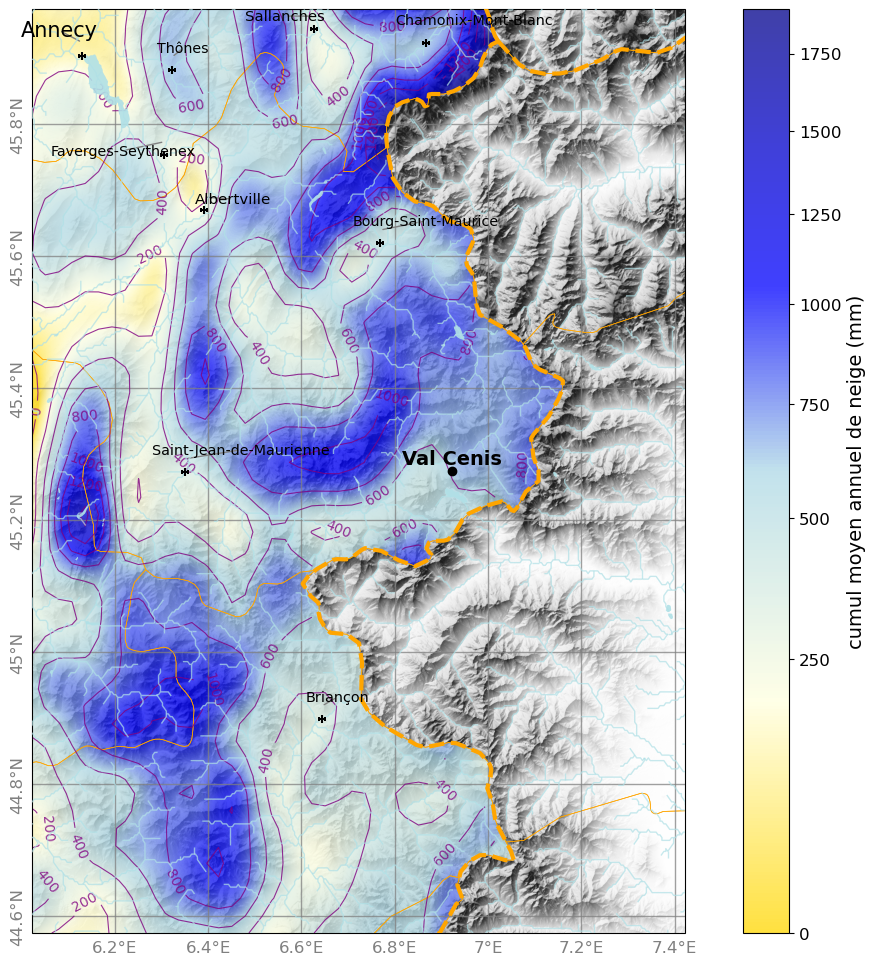

In [52]:
data       = xr.open_dataset(r.content)
nombre_ans = int(an_fin)-int(an_début)+1
neige      = data.PRENEI_Q.sum(dim="time")/nombre_ans # on divise la somme par le nombre d'années

 

fig,_ = tracer(neige,titre='cumul moyen annuel de neige (mm)',cmap = custom_cmap_r,nom_poste='Val Cenis') #nom_commune)

In [53]:
fig.savefig(répertoire_résultats+'/'+f'carte_cumul_annuel_moyen_neige.png',dpi=300,bbox_inches='tight')

In [54]:
def calculer_cumul(neige,longitude_poste,latitude_poste,nom_poste,an_début,an_fin,verbosité = False):
    def distance_plane_approx(lat1, lon1, lat2, lon2):
        """
        Approximation plane - très rapide mais moins précise sur grandes distances
        """
        # Facteur de conversion degrés -> km (approximatif)
        lat_to_km = 111.32  # km par degré de latitude
        lon_to_km = 111.32 * np.cos(np.radians((lat1 + lat2) / 2))  # correction longitude
        
        dlat_km = (lat2 - lat1) * lat_to_km
        dlon_km = (lon2 - lon1) * lon_to_km
        
        return np.sqrt(dlat_km**2 + dlon_km**2)
    noeud_sélectionné = neige.sel(x=longitude_poste,y=latitude_poste,method="nearest")
    longitude_noeud = noeud_sélectionné.x.values.item()
    latitude_noeud  = noeud_sélectionné.y.values.item()
    # Application
    distances = distance_plane_approx(
        liste_noeuds['latitude'].values,
        liste_noeuds['longitude'].values,
        latitude_noeud, 
        longitude_noeud
    )
    index_plus_proche = distances_carrees.argmin()
    noeud_plus_proche = liste_noeuds.loc[index_plus_proche]
    if verbosité:
        print(f"Distance minimale : {np.sqrt(distances_carrees.min()):.2f} m")
        print(f"Noeud le plus proche :")
        print(noeud_plus_proche)
    info_1 = f"Le cumul moyen des chutes de neige sur le noeud {index_plus_proche} (secteur {nom_poste}) "
    info_2 = f"est de {int(neige.sel(x=longitude_poste,y=latitude_poste,method="nearest").values )} mm sur la période {an_début}-{an_fin} "
    info_3 = f"à une altitude de {noeud_plus_proche.altitude} m."
    return info_1 + info_2 + info_3




In [55]:
info = calculer_cumul(neige,longitude_poste,latitude_poste,nom_poste,an_début,an_fin)
print(info)

ajouter_information("--- nivométrie et pluviométrie ---")
ajouter_information(info)

Le cumul moyen des chutes de neige sur le noeud 7691 (secteur Val Cenis (La Berche)) est de 660 mm sur la période 1958-2025 à une altitude de 2067.0 m.


In [56]:
variabilité_cumul = []
for i in range(-1,2):
      for j in range(-1,2):
            x=neige.sel(x=longitude_poste+2*i*delta_x,y=latitude_poste+2*j*delta_y,method="nearest").x.values
            y=neige.sel(x=longitude_poste+2*i*delta_x,y=latitude_poste+2*j*delta_y,method="nearest").y.values
            cumul24 = neige.sel(x=longitude_poste+2*i*delta_x,y=latitude_poste+2*j*delta_y,method="nearest").values
            z = cumul24
            variabilité_cumul.append(cumul24)
            print(" x = ",np.round(x,3)," y = ",np.round(y,3),": cumul ",int(z), "(noeud ", i," - ", j, ")")
info = f"Le cumul moyen de neige sur la région autour de {nom_commune} est {int(np.mean(variabilité_cumul))} mm avec un écart-type {int(np.std(variabilité_cumul))} mm."
print(info)
ajouter_information(info)


 x =  6.859  y =  45.195 : cumul  602 (noeud  -1  -  -1 )
 x =  6.859  y =  45.274 : cumul  472 (noeud  -1  -  0 )
 x =  6.859  y =  45.354 : cumul  753 (noeud  -1  -  1 )
 x =  6.939  y =  45.195 : cumul  453 (noeud  0  -  -1 )
 x =  6.939  y =  45.274 : cumul  660 (noeud  0  -  0 )
 x =  6.939  y =  45.354 : cumul  681 (noeud  0  -  1 )
 x =  7.019  y =  45.195 : cumul  453 (noeud  1  -  -1 )
 x =  7.019  y =  45.274 : cumul  660 (noeud  1  -  0 )
 x =  7.019  y =  45.354 : cumul  681 (noeud  1  -  1 )
Le cumul moyen de neige sur la région autour de Val Cenis (La Berche) est 602 mm avec un écart-type 107 mm.


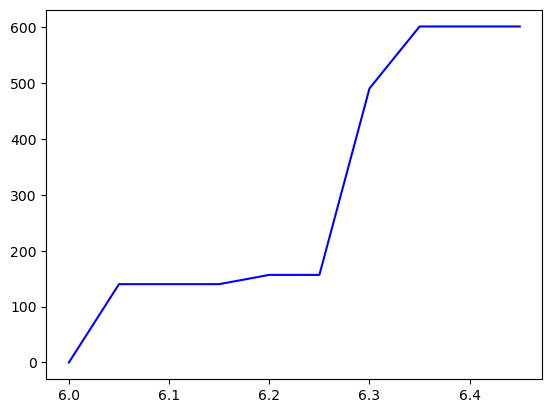

In [57]:
#Profil de cumul le long de la latitude 45,27° selon trois méthodes
xx = np.arange(6,6.5,0.05)
yl = 46
zz2= [float(neige.sel(x=x,y=yl,method="nearest").values ) for x in xx]

 
plt.plot(xx,zz2,'b')

# Valeurs extrêmes de neige

Nombre de NaN dans les données originales: 280


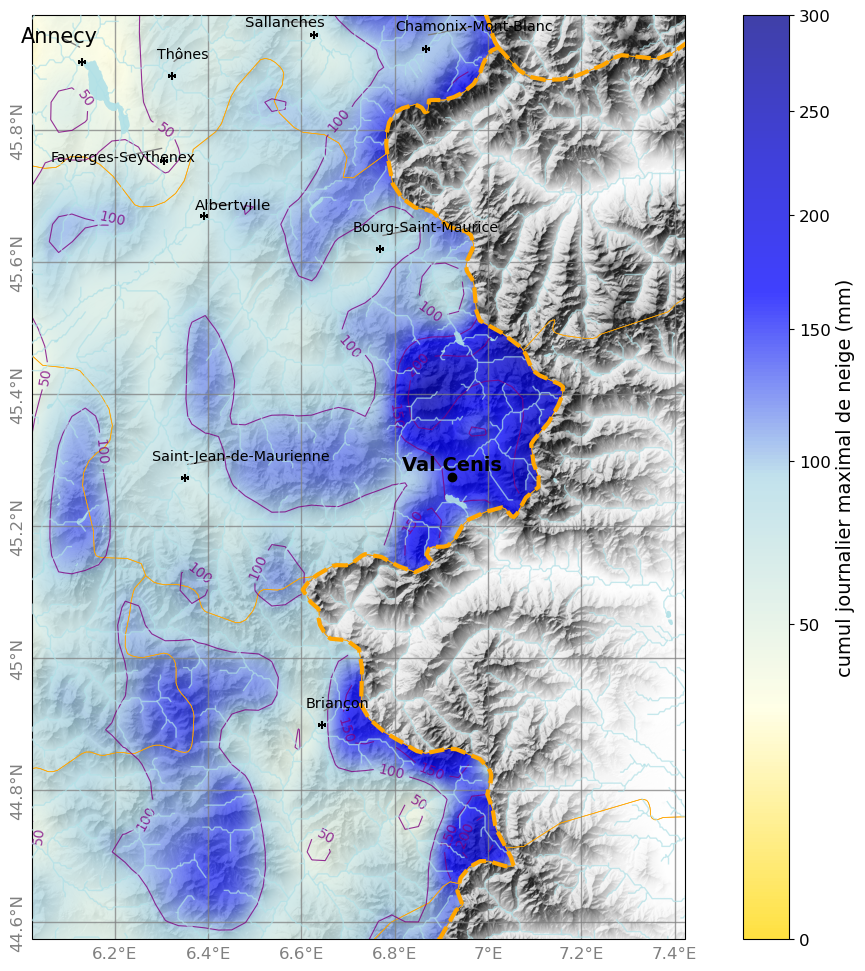

In [58]:
data       = xr.open_dataset(r.content)
nombre_ans = int(date[11:15])-int(date[0:4])+1
neige      = data.PRENEI_Q.max(dim="time") 
# Vérifier et traiter les NaN avant l'interpolation
print(f"Nombre de NaN dans les données originales: {neige.isnull().sum().values}")

# Option A: Remplacer les NaN par 0 (ou une autre valeur appropriée)
if neige.isnull().sum().values:
    neige_corrigée = neige.fillna(0)
    fig, _ = tracer(neige_corrigée,titre='cumul journalier maximal de neige (mm)',pas=50,nom_poste='Val Cenis') #nom_commune)
else:
    fig, _ = tracer(neige,titre='cumul journalier maximal de neige (mm)',pas=50,nom_poste='Val Cenis') #nom_commune)

In [59]:
fig.savefig(répertoire_résultats+'/'+"carte_chute_journaliere_neige_max.png",bbox_inches='tight',dpi=300)

In [60]:
info = f"Le cumul journalier max des chutes de neige sur {nom_poste} est de \
    {int(neige.sel(x=longitude_poste,y=latitude_poste,method="nearest").values )} mm sur la période {an_début}-{an_fin}."
print(info)
ajouter_information(info)

Le cumul journalier max des chutes de neige sur Val Cenis (La Berche) est de     177 mm sur la période 1958-2025.


# Précipitations totales max

In [61]:
data       = xr.open_dataset(r.content)
nombre_ans = int(date[11:15])-int(date[0:4])+1
précipitations_extrêmes = (data.PRELIQ_Q+data.PRENEI_Q).max(dim="time")


 

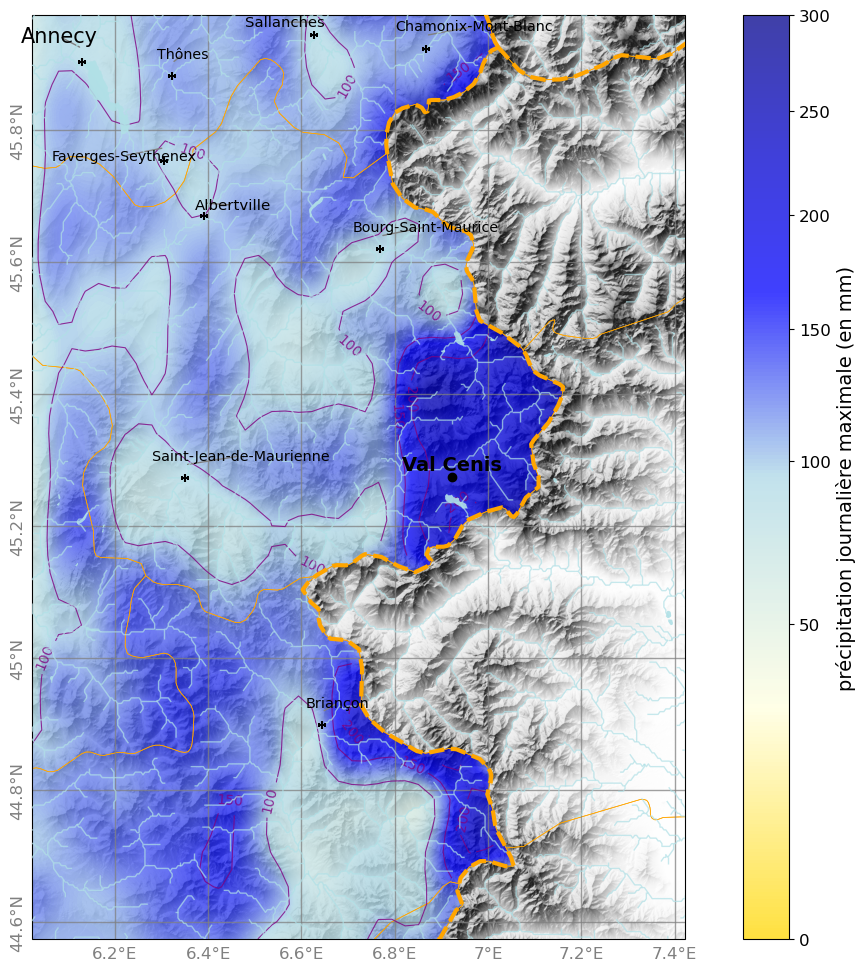

In [62]:
fig, _ = tracer(précipitations_extrêmes,titre='précipitation journalière maximale (en mm)',calcul_valeur_min=True, pas =50, gamma = 0.6,nom_poste='Val Cenis') #nom_commune)

In [63]:
fig.savefig(répertoire_résultats+'/'+"carte_précipitation_journalière_maximale.png",bbox_inches='tight',dpi=300)

In [64]:
info = f"La précipitation (totale) maximale sur {nom_poste} est de \
    {int(précipitations_extrêmes.sel(x=longitude_poste,y=latitude_poste,method="nearest").values )} mm sur la période {an_début}-{an_fin}."
print(info)
ajouter_information(info)

La précipitation (totale) maximale sur Val Cenis (La Berche) est de     210 mm sur la période 1958-2025.


# Précipitations totales moyennes

In [65]:
data       = xr.open_dataset(r.content)
nombre_ans = int(date[11:15])-int(date[0:4])+1
précipitations_moyennes = (data.PRELIQ_Q+data.PRENEI_Q).sum(dim="time")/nombre_ans


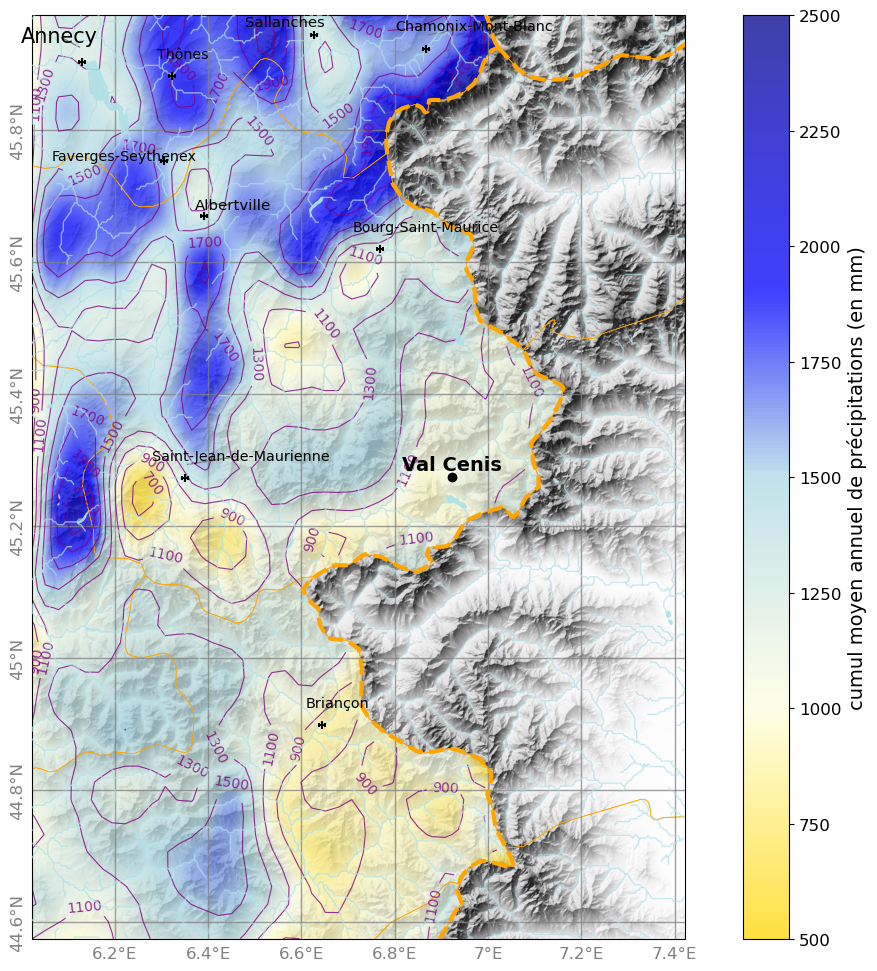

In [66]:
fig, _ = tracer(précipitations_moyennes,titre='cumul moyen annuel de précipitations (en mm)',calcul_valeur_min=True,gamma = 1,nom_poste='Val Cenis') #nom_commune)

In [67]:
fig.savefig(répertoire_résultats+'/'+"cartes_cumul_moyen_précipitations_annuelles.png",bbox_inches='tight',dpi=300)

In [68]:
info = f"Le cumul moyen annuel des précipitations (neige et pluie) sur {nom_poste} est de \
{int(précipitations_moyennes.sel(x=longitude_poste,y=latitude_poste,method="nearest").values )} mm sur la période {an_début}-{an_fin}."
print(info)
ajouter_information(info)

Le cumul moyen annuel des précipitations (neige et pluie) sur Val Cenis (La Berche) est de 1067 mm sur la période 1958-2025.


# série temporelle

## initialisation

In [69]:
# coordonnées en RGF93 du poste
x_poste, y_poste = latlon_to_lambert.transform(latitude_poste,longitude_poste)

translation_x = 0000 # rajout de 3 km
x_poste       = x_poste+translation_x
param_name = 'PRENEI_Q,PRELIQ_Q,T_Q'
#projection='EPSG:4326'
#coord='POINT('+str(latitude_poste)+" "+str(longitude_poste)+")"
#coord='POINT(1011370 6471230)'
coord      = 'POINT('+str(x_poste)+' '+str(y_poste)+')'
projection = 'EPSG:2154'
formatage  = 'CoverageJSON'
date       = '1958-01-01/2025-12-31'
date       = '1958-01-01/'+str(année_en_cours-1)+'-12-31'
requete    = f'https://api.geosas.fr/edr/collections/safran-isba/position?coords={coord}&crs={projection}&parameter-name={param_name}&f={formatage}&datetime={date}'
print(requete)
r=requests.get(requete, verify=True)
data=r.json()
if r.status_code == 200:
    print("J'ai récupéré les données.")
else :
    print(colored("Il y a une erreur avec le code : {:d}.".format(r.status_code), 'red') )

 

https://api.geosas.fr/edr/collections/safran-isba/position?coords=POINT(1007438.4019957834 6471505.5820112)&crs=EPSG:2154&parameter-name=PRENEI_Q,PRELIQ_Q,T_Q&f=CoverageJSON&datetime=1958-01-01/2025-12-31
J'ai récupéré les données.


In [70]:
reload_valeurs_extremes()

from module_valeurs_extremes import exporter_image, reload_valeurs_extremes

Module rechargé avec succès.


## neige

La chute de neige maximale a été observée le 24/11/2016 avec un cumul journalier de 108.3 mm.


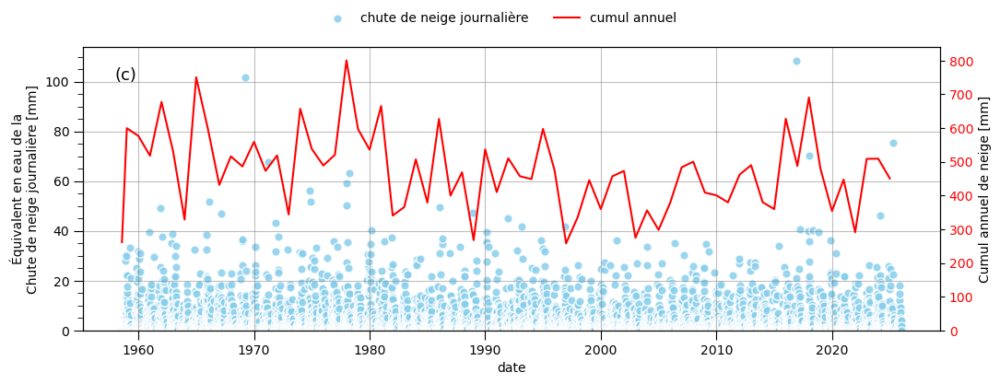

In [72]:
afficher_étiquette = True

safran_temps=data['domain']['axes']['t']['values']
#values=data['ranges'][param_name]['values']
safran_neige=np.array(data['ranges']['PRENEI_Q']['values'])
série_safran_neige=pd.DataFrame()
série_safran_neige['neige']=safran_neige
série_safran_neige['date']=pd.to_datetime(safran_temps, format='%Y-%m-%dT%H-%M-%SZ')

cumul_mensuel = série_safran_neige.groupby(by = [série_safran_neige['date'].dt.month, série_safran_neige['date'].dt.year])['neige'].sum() 
dates_cum     = (série_safran_neige.groupby(by = [série_safran_neige['date'].dt.month, série_safran_neige['date'].dt.year]).first())['date']

cumul_annuel = série_safran_neige.groupby(by = [ série_safran_neige['date'].dt.year])['neige'].sum() 
dates_an     = (série_safran_neige.groupby(by = [  série_safran_neige['date'].dt.year]).first())['date']

# max des valeurs
P_max = np.ceil(série_safran_neige['neige'].max()*1.05)
C_max = np.ceil(cumul_annuel.max()*1.05)
série_safran_neige = série_safran_neige[série_safran_neige['neige']>0]
# distribution temporelle des distributions
#unité_variable = liste_variables_possibles[ liste_variables_possibles[:, 0] =='PRENEI_Q'][0][2]
fig, ax = plt.subplots(figsize=(12,4))
ax.scatter(série_safran_neige['date'], série_safran_neige['neige'],marker = "o" , s = 45,
           color='skyblue',edgecolor="white",alpha = 0.85,label = "chute de neige journalière")

ax.set_ylim((0,P_max))

ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which='major', length=7)
ax.tick_params(which='minor', length=4)

ax.set_ylabel(r'Équivalent en eau de la' '\n' r'Chute de neige journalière [mm]')
ax.set_xlabel(r'date')
max_neige = np.nanmax(safran_neige)
date_max= série_safran_neige[série_safran_neige['neige']==max_neige]['date'] .values[0]   
# le format de données du temps est bizarre il faut supprimer les 10 dernier caractères
date_max=datetime.strptime(str(date_max)[:-10] ,"%Y-%m-%dT%H:%M:%S").strftime("%d/%m/%Y")
info = f"La chute de neige maximale a été observée le {date_max} avec un cumul journalier de {max_neige:.1f} mm." 
print(info)   
plt.grid(True, color = 'gray', alpha=0.5)

ax2 = ax.twinx()   

# tracé des cumul
color = 'red'
ax2.set_ylim((0,C_max))
ax2.set_ylabel('Cumul annuel de neige [mm]' )   
ax2.plot(dates_an, cumul_annuel, color=color, alpha = 1, linewidth = 1.5, 
         label = "cumul annuel")
ax2.tick_params(axis='y', labelcolor=color)
fig.legend(loc="upper center", ncol=2,frameon=False)
if afficher_étiquette:
    ax.text(0.05, 0.9,   '(c)',
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes,fontsize=13)
#fig.savefig(répertoire_résultats+'/'+'chronique_neige_safran.png',bbox_inches='tight',dpi=300)


In [73]:
exporter_image(fig,f"safran({nom_commune})",'double-chronique','neige_P1J-Pan')
ajouter_information("")
ajouter_information("--- information sur la série chronologique ---")
ajouter_information(info)

Dossier d'export d:\Data\meteo.data\postes\Val_Cenis_(La_Berche)_73144404
export de safran(Val-Cenis-(La-Berche))_double-chronique_neige_P1J-Pan.png réussi


In [74]:
info = f"La moyenne interannuelle du cumul annuel est {int(cumul_annuel.mean())} mm et l'écart-type est {int(np.std(cumul_annuel))} mm."
print(info)
ajouter_information(info)
info = f"Le maximum du cumul annuel est {int(cumul_annuel.max())} mm."
print(info)
ajouter_information(info)

La moyenne interannuelle du cumul annuel est 472 mm et l'écart-type est 117 mm.
Le maximum du cumul annuel est 800 mm.


In [75]:
# export au format CVS
(série_safran_neige[['date','neige']].fillna(value=0)).to_csv('données_safran_neige.csv', sep='\t', encoding='utf-8',index = False)
(série_safran_neige[['date','neige']].fillna(value=0)).to_pickle('données_safran_neige.pkl' )

In [76]:
série_safran_neige 

,neige,date
20,0.2,1958-08-21
21,0.1,1958-08-22
61,1.5,1958-10-01
62,0.1,1958-10-02
64,1.0,1958-10-04
...,...,...
24615,4.2,2025-12-22
24616,1.4,2025-12-23
24617,1.6,2025-12-24
24618,1.7,2025-12-25


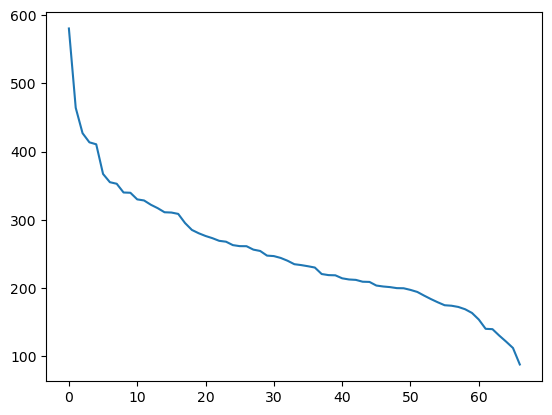

In [77]:
hiver = série_safran_neige[série_safran_neige['date'].dt.month <= 4]
cumul_hiver = np.array(hiver['neige'].groupby(by=hiver['date'].dt.year).sum())
cumul_hiver_trié = np.sort(cumul_hiver)[::-1]
np.where(cumul_hiver_trié == cumul_hiver[-1])
plt.plot(cumul_hiver_trié)

In [78]:
cumul_annuel_max = np.nanmax(cumul_annuel)
cumul_annuel_min = np.nanmin(cumul_annuel)
cumul_annuel_moy = np.nanmean(np.delete(cumul_annuel,-1))
info = f"Le cumul maximal de neige est {int(cumul_annuel_max)} mm et a été observé en {np.array(cumul_annuel[cumul_annuel==cumul_annuel_max].index )[0]}."
print(info)
ajouter_information(info)
info = f"Le cumul minimal de neige est {int(cumul_annuel_min)} mm et a été observé en {np.array(cumul_annuel[cumul_annuel==cumul_annuel_min].index )[0]}."
print(info)
ajouter_information(info)
info = f"Le cumul moyen de neige est {int(cumul_annuel_moy)} mm."
print(info)
ajouter_information(info)

Le cumul maximal de neige est 800 mm et a été observé en 1978.
Le cumul minimal de neige est 258 mm et a été observé en 1997.
Le cumul moyen de neige est 472 mm.


## cumul précipitations liquides (sans neige)

La pluie maximale a été observée le 31/03/1981 avec un cumul journalier de 113.6 mm.


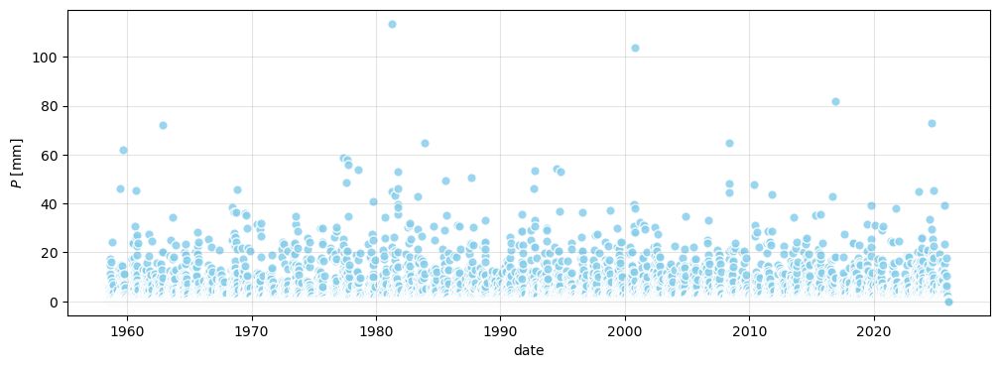

In [79]:
safran_temps=data['domain']['axes']['t']['values']
#values=data['ranges'][param_name]['values']
safran_pluie=np.array(data['ranges']['PRELIQ_Q']['values'])
série_safran_pluie=pd.DataFrame()
série_safran_pluie['pluie']=safran_pluie
série_safran_pluie['date']=pd.to_datetime(safran_temps, format='%Y-%m-%dT%H-%M-%SZ')

# distribution temporelle des distributions
#unité_variable = liste_variables_possibles[ liste_variables_possibles[:, 0] =='PRENEI_Q'][0][2]
fig, ax = plt.subplots(figsize=(12,4))
ax.scatter(série_safran_pluie['date'], série_safran_pluie['pluie'],marker = "o" , s = 45,
           color='skyblue',edgecolor="white",alpha = 0.85)
ax.set_ylabel(r'$P$ [mm]')
ax.set_xlabel(r'date')
max_pluie = np.nanmax(safran_pluie)
date_max  = série_safran_pluie[série_safran_pluie['pluie']==max_pluie]['date'] .values[0]   
# le format de données du temps est bizarre il faut supprimer les 10 dernier caractères
date_max=datetime.strptime(str(date_max)[:-10] ,"%Y-%m-%dT%H:%M:%S").strftime("%d/%m/%Y")
info = f"La pluie maximale a été observée le {date_max} avec un cumul journalier de {max_pluie:.1f} mm." 
print(info)   
plt.grid(True, color = 'gray', alpha=0.2)

In [80]:
exporter_image(fig,f"safran({nom_commune})",'chronique','pluie-P1J')
ajouter_information("")
ajouter_information("--- information sur les pluies sans neige ---")
ajouter_information(info)

Dossier d'export d:\Data\meteo.data\postes\Val_Cenis_(La_Berche)_73144404
export de safran(Val-Cenis-(La-Berche))_chronique_pluie-P1J.png réussi


In [81]:
# export au format CVS
(série_safran_pluie[['date','pluie']].fillna(value=0)).to_csv('données_safran_pluie_sans_neige.csv', sep='\t', encoding='utf-8' ,index = False)
(série_safran_pluie[['date','pluie']].fillna(value=0)).to_pickle('données_safran_pluie_sans_neige.pkl' )

In [82]:
série_safran_pluie['pluie']

0        5.6
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
24620    0.0
24621    0.0
24622    0.0
24623    0.0
24624    0.0
Name: pluie, Length: 24625, dtype: float64

In [83]:
série_safran_pluie = série_safran_pluie[série_safran_pluie.date<"2024-01-01"]
cumul_annuel = série_safran_pluie.groupby(by = [ série_safran_pluie['date'].dt.year])['pluie'].sum() 
dates_an     = (série_safran_pluie.groupby(by = [  série_safran_pluie['date'].dt.year]).first())['date']

In [84]:
cumul_annuel_max = np.nanmax(cumul_annuel)
cumul_annuel_min = np.nanmin(cumul_annuel)
cumul_annuel_moy = np.nanmean(np.delete(cumul_annuel,-1))
info = f"Le cumul maximal de pluies est {int(cumul_annuel_max)} mm et a été observé en {np.array(cumul_annuel[cumul_annuel==cumul_annuel_max].index )[0]}."
print(info)
ajouter_information(info)
info = f"Le cumul minimal de pluies est {int(cumul_annuel_min)} mm et a été observé en {np.array(cumul_annuel[cumul_annuel==cumul_annuel_min].index )[0]}."
print(info)
ajouter_information(info)
info = f"Le cumul moyen de pluies est {int(cumul_annuel_moy)} mm."
print(info)
ajouter_information(info)

Le cumul maximal de pluies est 869 mm et a été observé en 1981.
Le cumul minimal de pluies est 217 mm et a été observé en 1958.
Le cumul moyen de pluies est 486 mm.


In [85]:
assemblage=pd.concat([série_safran_neige,série_safran_pluie],axis=1) 
assemblage[['date','neige','pluie']].to_csv("safran_neige.csv",index = False)

## cumul de précipitations totales

La précipitation la plus forte  a été observée le 24/11/2016 avec un cumul journalier de 190.2 mm.
Le cumul annuel moyen de précipitations (neige et pluie) est 962 mm (écart-type 190 mm).


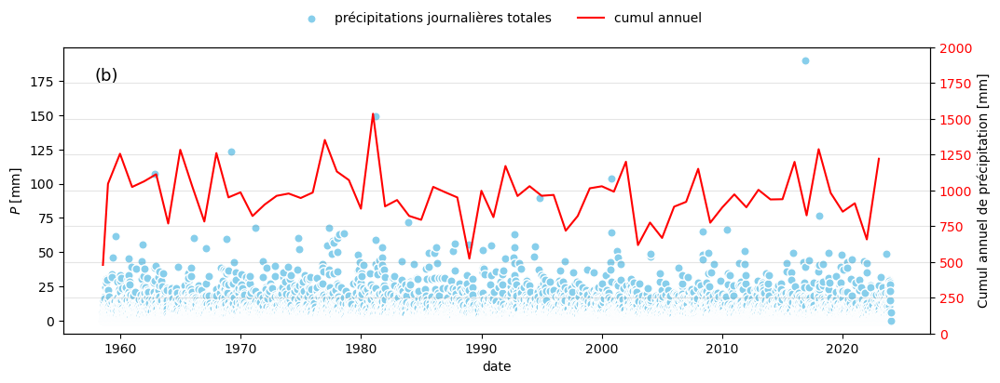

In [86]:
afficher_étiquette = True
P_max = 200
C_max = 2000
safran_temps         = data['domain']['axes']['t']['values']
safran_précipitation = np.array(data['ranges']['PRELIQ_Q']['values'])+np.array(data['ranges']['PRENEI_Q']['values'])
série_safran_précipitation = pd.DataFrame()
série_safran_précipitation['précipitation'] = safran_précipitation
série_safran_précipitation['date']          = pd.to_datetime(safran_temps, format='%Y-%m-%dT%H-%M-%SZ')
série_safran_précipitation = série_safran_précipitation[série_safran_précipitation.date<"2024-01-01"]
cumul_annuel = série_safran_précipitation.groupby(by = [ série_safran_précipitation['date'].dt.year])['précipitation'].sum() 
dates_an     = (série_safran_précipitation.groupby(by = [  série_safran_précipitation['date'].dt.year]).first())['date']
 


# distribution temporelle des distributions
#unité_variable = liste_variables_possibles[ liste_variables_possibles[:, 0] =='PRENEI_Q'][0][2]
fig, ax = plt.subplots(figsize=(12,4))
ax.scatter(série_safran_précipitation['date'], série_safran_précipitation['précipitation'],  marker = "o",edgecolors='white', s=45, color='skyblue', alpha = 1,label='précipitations journalières totales')
ax.set_ylabel(r'$P$ [mm]')
ax.set_xlabel(r'date')

ax2 = ax.twinx()   

# tracé des cumuls annuels
color = 'red'
ax2.set_ylim((0,C_max))
ax2.set_ylabel('Cumul annuel de précipitation [mm]' )   
ax2.plot(dates_an, cumul_annuel, color=color, alpha = 1, linewidth = 1.5, 
         label = "cumul annuel")
ax2.tick_params(axis='y', labelcolor=color)
fig.legend(loc="upper center",frameon=False,ncols=2)

fig.savefig(répertoire_résultats+'/'+'chronique_précipitations-totales_safran.png',bbox_inches='tight',dpi=300)


max_précipitation = np.nanmax(safran_précipitation)
date_max  = série_safran_précipitation[série_safran_précipitation['précipitation']==max_précipitation]['date'] .values[0]   
# le format de données du temps est bizarre il faut supprimer les 10 dernier caractères
date_max=datetime.strptime(str(date_max)[:-10] ,"%Y-%m-%dT%H:%M:%S").strftime("%d/%m/%Y")
info = "La précipitation la plus forte  a été observée le "+date_max+" avec un cumul journalier de {:.1f} mm.".format(max_précipitation)
print(info)   
plt.grid(True, color = 'gray', alpha=0.2)
info2 = f"Le cumul annuel moyen de précipitations (neige et pluie) est {cumul_annuel.mean():.0f} mm (écart-type {cumul_annuel.std():.0f} mm)."
print(info2)
if afficher_étiquette:
    ax.text(0.05, 0.9,  '(b)'  ,
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes,fontsize=13)

In [87]:
os.getcwd()

'd:\\Data\\meteo.data\\postes\\Val_Cenis_(La_Berche)_73144404'

In [88]:
exporter_image(fig,f"safran({nom_commune})",'double-chronique','précipitations_P1J-Pan')
ajouter_information("")
ajouter_information("--- information sur les précipitations totales ---")
ajouter_information(info)
ajouter_information(info2)

Dossier d'export d:\Data\meteo.data\postes\Val_Cenis_(La_Berche)_73144404
export de safran(Val-Cenis-(La-Berche))_double-chronique_précipitations_P1J-Pan.png réussi


In [89]:
série_safran_précipitation

,précipitation,date
0,5.6,1958-08-01
1,0.0,1958-08-02
2,0.0,1958-08-03
3,0.0,1958-08-04
4,0.0,1958-08-05
...,...,...
23889,0.0,2023-12-27
23890,0.6,2023-12-28
23891,0.2,2023-12-29
23892,0.0,2023-12-30


In [90]:
(série_safran_précipitation[['date','précipitation']].fillna(value=0)).to_csv('données_safran_précipitations_totales.csv', sep='\t', encoding='utf-8' ,index = False)
(série_safran_précipitation[['date','précipitation']].fillna(value=0)).to_pickle('données_safran_précipitations_totales.pkl' )

## Température

Le maximum a été atteint le 27/06/2019 avec une température journalière de 20.5 °C.
Le minimum a été atteint le 09/02/1986 avec une température journalière de -20.8 °C.
La moyenne est de 2.5 °C.
Le gradient de température 2.02 °C/siècle.


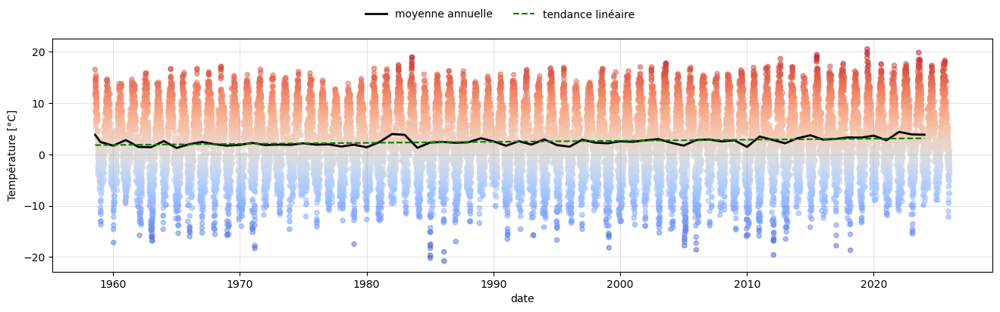

In [91]:
safran_temps = data['domain']['axes']['t']['values']
#values=data['ranges'][param_name]['values']
safran_temperature = np.array(data['ranges']['T_Q']['values'])
série_safran_temp  = pd.DataFrame()
série_safran_temp['temp'] = safran_temperature
série_safran_temp['date'] = pd.to_datetime(safran_temps, format='%Y-%m-%dT%H-%M-%SZ')



# distribution temporelle des distributions
#unité_variable = liste_variables_possibles[ liste_variables_possibles[:, 0] =='PRENEI_Q'][0][2]

# Make a user-defined colormap.
cm1 = mcolors.LinearSegmentedColormap.from_list("MyCmapName",["lightskyblue","red"])
cnorm = mcolors.Normalize(vmin=-10,vmax=15)

fig, ax = plt.subplots(figsize=(16,4))
ax.scatter(série_safran_temp['date'], série_safran_temp['temp'],marker = "o",c=série_safran_temp['temp'],cmap='coolwarm',s=20,   alpha = 0.5)
ax.set_ylabel(r'Température [°C]')
ax.set_xlabel(r'date')

plt.grid(True, color = 'gray', alpha=0.2)

température_annuelle  = np.delete(np.array(série_safran_temp.groupby(by = [série_safran_temp['date'].dt.year])['temp'].mean()),-1)
dates_température_an  = np.delete(np.array((série_safran_temp.groupby(by = [  série_safran_temp['date'].dt.year ]).first())['date']),-1)
import matplotlib.dates as mdates  # un conflit de format de dates entre numpy et 
slope, intercept, r_value, p_value, std_err = stats.linregress(mdates.date2num(dates_température_an) , température_annuelle )
trendline = intercept + slope*mdates.date2num(dates_température_an) 

ax.plot(dates_température_an,température_annuelle,label="moyenne annuelle", linewidth = 2, color = 'black')
ax.plot(dates_température_an,trendline,label="tendance linéaire", linestyle = '--', color = 'green')

fig.legend(loc="upper center",frameon=False,ncol=2)
max_temperature = np.nanmax(safran_temperature)
min_temperature = np.nanmin(safran_temperature)
moy_temperature = np.nanmean(safran_temperature)
date_max  = série_safran_temp[série_safran_temp['temp']==max_temperature]['date'] .values[0]   
date_min  = série_safran_temp[série_safran_temp['temp']==min_temperature]['date'] .values[0]  
# le format de données du temps est bizarre il faut supprimer les 10 dernier caractères
date_max=datetime.strptime(str(date_max)[:-10] ,"%Y-%m-%dT%H:%M:%S").strftime("%d/%m/%Y")
date_min=datetime.strptime(str(date_min)[:-10] ,"%Y-%m-%dT%H:%M:%S").strftime("%d/%m/%Y")
info1 = "Le maximum a été atteint le "+date_max+" avec une température journalière de {:.1f} °C.".format(max_temperature)
info2 = "Le minimum a été atteint le "+date_min+" avec une température journalière de {:.1f} °C.".format(min_temperature)
info3 = "La moyenne est de {:.1f} °C.".format(moy_temperature)
info4 = "Le gradient de température {:.2f} °C/siècle.".format(100*slope*365)
print(info1)   
print(info2) 
print(info3) 
print(info4) 

In [92]:
exporter_image(fig,f"safran({nom_commune})",'double-chronique','température_TX-TM-tendance')
ajouter_information("")
ajouter_information("--- information sur les températures ---")
ajouter_information(info1)
ajouter_information(info2)
ajouter_information(info3)
ajouter_information(info4)

Dossier d'export d:\Data\meteo.data\postes\Val_Cenis_(La_Berche)_73144404
export de safran(Val-Cenis-(La-Berche))_double-chronique_température_TX-TM-tendance.png réussi


In [93]:
série_safran_précipitation.to_csv("safran_pluie.csv",sep=",")

# Export information

In [94]:
fichier = f"synthèse_extraction_safran_{nom_commune.replace(" ","-")}.txt"
with open(Path(répertoire_résultats) /fichier, 'w', encoding='utf-8') as f:
                f.write("\n".join(lignes_sortie))
print(f"\nInformations sauvegardées dans: {fichier} dans {répertoire_résultats}")


Informations sauvegardées dans: synthèse_extraction_safran_Val-Cenis-(La-Berche).txt dans /Data/meteo.data/postes/Val_Cenis_(La_Berche)_73144404
